In [ ]:
from google.colab import drive
drive.mount('/content/drive')

Mounted at /content/drive


In [ ]:
import os
HOME = os.getcwd()
print(HOME)

/content


In [ ]:
!pip install git+https://github.com/ultralytics/ultralytics.git@main
!pip install -U albumentations
!pip install ultralytics[explorer] openai

  Cloning https://github.com/ultralytics/ultralytics.git (to revision main) to /tmp/pip-req-build-w0yf_k3c
  Running command git clone --filter=blob:none --quiet https://github.com/ultralytics/ultralytics.git /tmp/pip-req-build-w0yf_k3c
  Resolved https://github.com/ultralytics/ultralytics.git to commit d317b26940e4c064bd862cd5cfe426aaf76c41be
  Installing build dependencies ... done
  Getting requirements to build wheel ... done
  Preparing metadata (pyproject.toml) ... done
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 363.4/363.4 MB 2.6 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 13.8/13.8 MB 78.1 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 24.6/24.6 MB 69.8 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 883.7/883.7 kB 38.2 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 664.8/664.8 MB 2.1 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 211.5/211.5 MB 4.4 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━

# Data preprocessing

The preprocessing pipeline for YOLOv8 includes resizing and padding the image to a square shape, followed by normalizing the pixel values and converting the image to a tensor.
Although YOLOv8 handles resizing, padding, normalization, and tensor conversion internally.

YOLOv8 automatically performs several preprocessing steps, including conversion to RGB, scaling pixel values to the range [0, 1], and normalization using predefined mean and standard deviation values.

**Resizing** Images: Since YOLOv8 handles flexible input sizes and performs resizing automatically, (the model will resize input images so their largest dimension is 640 pixels while maintaining the original aspect ratio), manual resizing is not required. The model will adjust the image size according to the specified 'imgsz' parameter during training.

**Normalizing** Pixel Values: YOLOv8 automatically normalizes pixel values,     (normalization is seamlessly handled as part of its preprocessing pipeline during model training), to a range of 0 to 1 during preprocessing, so it's not required.



**Dataset Splitting**

In [ ]:
import os

# Paths to the 'images' and 'labels' folders
images_folder = '/content/drive/My Drive/Colab Notebooks/Final_Dataset/images'
labels_folder = '/content/drive/My Drive/Colab Notebooks/Final_Dataset/labels'

# Count the number of .jpg files in the images folder
jpg_files = [f for f in os.listdir(images_folder) if f.endswith('.jpg')]
num_jpg_files = len(jpg_files)

# Count the number of .txt files in the labels folder
txt_files = [f for f in os.listdir(labels_folder) if f.endswith('.txt')]
num_txt_files = len(txt_files)

print(f"Number of .jpg files in 'images' folder: {num_jpg_files}")
print(f"Number of .txt files in 'labels' folder: {num_txt_files}")

Number of .jpg files in 'images' folder: 14491
Number of .txt files in 'labels' folder: 14491


In [ ]:
from ultralytics.data.utils import autosplit

autosplit(
    path="/content/drive/My Drive/Colab Notebooks/Final_Dataset/images",
    weights=(0.7, 0.2, 0.1),
    annotated_only=False,
)

Autosplitting images from /content/drive/My Drive/Colab Notebooks/Final_Dataset/images


100%|██████████| 14491/14491 [01:11<00:00, 202.05it/s]


# Data augmentation

With respect to YOLOv8, you can augment your custom dataset by modifying the dataset configuration file, a .yaml file. In this file, you can add an augmentation section with parameters that specify how you want to augment your data [modify the dataset configuration file (.yaml) to include data augmentation techniques such as random crops, horizontal flips, and brightness adjustments].

Libraries like OpenCV, Albumentations, and TensorFlow offer flexible augmentation functions that you can use. Additionally, some libraries, such as Ultralytics, have built-in augmentation settings directly within its model training function, simplifying the process.

In [ ]:
# Offline augmentation custom pipeline

import albumentations as A
import cv2
import os

# Define the augmentation pipeline
transform = A.Compose([
            A.GaussNoise(
                var_limit=(10.0, 50.0),  # ScaleFloatType
                mean=0,  # float
                per_channel=False,  # bool
                noise_scale_factor=1,  # float
                always_apply=None,  # bool | None
                p=1.0,  # float
                ),
            A.MotionBlur(
                blur_limit=7,  # ScaleIntType
                allow_shifted=True,  # bool
                always_apply=None,  # bool | None
                p=1.0,  # float
                ),
            A.Sharpen(
                alpha=(0.2, 0.5),  # tuple[float, float]
                lightness=(0.5, 1.0),  # tuple[float, float]
                always_apply=None,  # bool | None
                p=1.0,  # float
                ),
            A.Affine(
                scale=(0.9, 1.1),  # ScaleFloatType | dict[str, Any] | None
                translate_percent=(-0.05, 0.05),  # ScaleFloatType | dict[str, Any] | None
                translate_px=None,  # ScaleIntType | dict[str, Any] | None
                rotate=(-5, 5),  # ScaleFloatType | None
                shear={"x": (-5, 5), "y": (-5, 5)},  # ScaleFloatType | dict[str, Any] | None
                interpolation=1,  # <class 'int'>
                mask_interpolation=0,  # int
                cval=0,  # ColorType
                cval_mask=0,  # ColorType
                mode=0,  # int
                fit_output=False,  # bool
                keep_ratio=True,  # bool
                rotate_method="largest_box",  # Literal['largest_box', 'ellipse']
                balanced_scale=True,  # bool
                always_apply=None,  # bool | None
                p=1.0,  # float
                ),
            A.OpticalDistortion(
                distort_limit=(-0.05, 0.05),  # ScaleFloatType
                shift_limit=(-0.05, 0.05),  # ScaleFloatType
                interpolation=1,  # <class 'int'>
                border_mode=0,  # int
                value=0,  # ColorType | None
                mask_value=None,  # ColorType | None
                always_apply=None,  # bool | None
                p=1.0,  # float
                ),
            A.Perspective(
                scale=(0.05, 0.1),  # ScaleFloatType
                keep_size=True,  # bool
                pad_mode=0,  # int
                pad_val=0,  # ColorType
                mask_pad_val=0,  # ColorType
                fit_output=False,  # bool
                interpolation=1,  # <class 'int'>
                always_apply=None,  # bool | None
                p=1.0,  # float
                ),
            A.HorizontalFlip(
                p=1.0,  # float
                always_apply=None,  # bool | None
                ),
            A.HueSaturationValue(
                hue_shift_limit=10,  # ScaleIntType
                sat_shift_limit=30,  # ScaleIntType
                val_shift_limit=20,  # ScaleIntType
                always_apply=None,  # bool | None
                p=1.0,  # float
                ),
            A.RandomBrightnessContrast(
                brightness_limit=(-0.2, 0.2),  # ScaleFloatType
                contrast_limit=(-0.2, 0.2),  # ScaleFloatType
                brightness_by_max=True,  # bool
                always_apply=None,  # bool | None
                p=1.0,  # float
                ),
            A.BBoxSafeRandomCrop(
                erosion_rate=0.0,  # float
                p=1.0,  # float
                always_apply=None,  # bool | None
                ),
            A.RandomRain(
                slant_lower=None,  # int | None
                slant_upper=None,  # int | None
                slant_range=(-10, 10),  # tuple[int, int]
                drop_length=20,  # int
                drop_width=1,  # int
                drop_color=(200, 200, 200),  # tuple[int, int, int]
                blur_value=5,  # int
                brightness_coefficient=0.9,  # float
                rain_type="drizzle",  # RainMode | None
                always_apply=None,  # bool | None
                p=1.0,  # float
                ),
            A.RandomGamma(
                gamma_limit=(80, 120),  # ScaleIntType
                always_apply=None,  # bool | None
                p=1.0  # float
                ),
            A.LongestMaxSize(
                max_size=640,
                interpolation=cv2.INTER_LINEAR,
                p=1.0),
            A.PadIfNeeded(
                min_height=640,
                min_width=640,
                border_mode=cv2.BORDER_CONSTANT,
                value=0,
                p=1.0),

], bbox_params=A.BboxParams(format='yolo', label_fields=['class_labels']))

def read_yolo_labels(label_path):
    """Read YOLO format labels from a file."""
    with open(label_path, 'r') as f:
        labels = f.readlines()
    bboxes = []
    class_labels = []
    for label in labels:
        parts = label.strip().split()
        class_id = int(parts[0])
        x_center = float(parts[1])
        y_center = float(parts[2])
        width = float(parts[3])
        height = float(parts[4])
        bboxes.append([x_center, y_center, width, height])
        class_labels.append(class_id)
    return bboxes, class_labels

def write_yolo_labels(label_path, bboxes, class_labels):
    """Write YOLO format labels to a file."""
    with open(label_path, 'w') as f:
        for bbox, class_id in zip(bboxes, class_labels):
            x_center = round(bbox[0], 6)
            y_center = round(bbox[1], 6)
            width = round(bbox[2], 6)
            height = round(bbox[3], 6)
            f.write(f"{class_id} {x_center} {y_center} {width} {height}\n")

def main(input_image_dir, input_label_dir, output_image_dir, output_label_dir, augmentations_per_image):
    if not os.path.exists(output_image_dir):
        os.makedirs(output_image_dir)
    if not os.path.exists(output_label_dir):
        os.makedirs(output_label_dir)

    for image_name in os.listdir(input_image_dir):
        if image_name.endswith(('.jpg', '.png')):
            image_path = os.path.join(input_image_dir, image_name)
            label_name = os.path.splitext(image_name)[0] + '.txt'
            label_path = os.path.join(input_label_dir, label_name)

            # Read image
            image = cv2.imread(image_path)
            if image is None:
                print(f"Error reading image {image_path}")
                continue
            image = cv2.cvtColor(image, cv2.COLOR_BGR2RGB)

            # Read labels
            bboxes, class_labels = read_yolo_labels(label_path)

            for i in range(augmentations_per_image):
                # Apply data augmentation
                transformed = transform(image=image, bboxes=bboxes, class_labels=class_labels)
                transformed_image = transformed['image']
                transformed_bboxes = transformed['bboxes']
                transformed_class_labels = transformed['class_labels']

                # Generate output paths
                output_image_path = os.path.join(output_image_dir, os.path.splitext(image_name)[0] + f'_aug_{i}.jpg')
                output_label_path = os.path.join(output_label_dir, os.path.splitext(image_name)[0] + f'_aug_{i}.txt')

                # Save augmented image and labels
                cv2.imwrite(output_image_path, cv2.cvtColor(transformed_image, cv2.COLOR_RGB2BGR))
                write_yolo_labels(output_label_path, transformed_bboxes, transformed_class_labels)

if __name__ == "__main__":
    # Define directories
    input_image_dir = '/content/drive/My Drive/Colab Notebooks/test_augments/images'
    input_label_dir = '/content/drive/My Drive/Colab Notebooks/test_augments/labels'
    output_image_dir = '/content/drive/My Drive/Colab Notebooks/augments/images'
    output_label_dir = '/content/drive/My Drive/Colab Notebooks/augments/labels'

    # Process images and labels with multiple augmentations
    main(input_image_dir, input_label_dir, output_image_dir, output_label_dir, augmentations_per_image=1)



*   Resizing Images
*   Normalizing Pixel Values
*   Splitting the Dataset
*   Data Augmentation

These steps make sure the dataset is prepared without any potential issues and is ready for Exploratory Data Analysis (EDA).

# Exploratory Data Analysis Techniques
After preprocessing and augmenting your dataset, the next step is to gain insights through Exploratory Data Analysis. EDA uses statistical techniques and visualization tools to understand the patterns and distributions in your data. You can identify issues like class imbalances or outliers and make informed decisions about further data preprocessing or model training adjustments.

To understand your data better, you can use tools like Matplotlib or Seaborn to visualize the images and analyze their distribution and characteristics. Visualizing your data helps identify patterns, anomalies, and the effectiveness of your augmentation techniques. You can also use Ultralytics Explorer, a tool for exploring computer vision datasets with semantic search, SQL queries, and vector similarity search.

In [ ]:
# Ultralytics Explorer API
# explore your datasets using with the power of semantic search
# examine specific types of labels using vector search or even SQL queries.
import ultralytics
ultralytics.checks()

Ultralytics YOLOv8.2.98 🚀 Python-3.10.12 torch-2.4.1+cu121 CPU (AMD EPYC 7B12)
Setup complete ✅ (8 CPUs, 51.0 GB RAM, 33.2/225.8 GB disk)


In [ ]:
# TRAIN SET

from ultralytics import Explorer

exp = Explorer("/content/drive/My Drive/Colab Notebooks/Final_Dataset/Dataset.yaml", model="yolov8l.pt")
exp.create_embeddings_table()

100%|██████████| 83.7M/83.7M [00:00<00:00, 299MB/s]


100%|██████████| 755k/755k [00:00<00:00, 14.4MB/s]
Scanning /content/drive/My Drive/Colab Notebooks/Final_Dataset/labels.cache... 10177 images, 375 backgrounds, 0 corrupt: 100%|██████████| 10177/10177 [00:00<?, ?it/s]
100%|██████████| 10177/10177 [1:59:12<00:00,  1.42it/s]


In [ ]:
# Images that do not contain any vehicle

files_with_no_labels = exp.sql_query("SELECT im_file FROM 'table' WHERE labels = '[]'")

files_with_no_labels

Running query: SELECT im_file FROM 'table' WHERE labels = '[]'


,im_file
0,/content/drive/My Drive/Colab Notebooks/Final_...
1,/content/drive/My Drive/Colab Notebooks/Final_...
2,/content/drive/My Drive/Colab Notebooks/Final_...
3,/content/drive/My Drive/Colab Notebooks/Final_...
4,/content/drive/My Drive/Colab Notebooks/Final_...
...,...
370,/content/drive/My Drive/Colab Notebooks/Final_...
371,/content/drive/My Drive/Colab Notebooks/Final_...
372,/content/drive/My Drive/Colab Notebooks/Final_...
373,/content/drive/My Drive/Colab Notebooks/Final_...


In [ ]:
# Step 2: Iterate over the identified files and delete them
for im_file in files_with_no_labels['im_file']:
    exp.table.delete(f"im_file = '{im_file}'")

In [ ]:
print(f"Deleted {len(files_with_no_labels)} images that had no labels.")

Deleted 375 images that had no labels.


In [ ]:
# Verification

no_labels = exp.sql_query("SELECT im_file FROM 'table' WHERE labels = '[]'")
no_labels

Running query: SELECT im_file FROM 'table' WHERE labels = '[]'


,im_file


In [ ]:
# Create similarity index

sim_idx = exp.similarity_index(force=True)

100%|██████████| 9802/9802 [3:54:52<00:00,  1.44s/it]


In [ ]:
sim_idx

,idx,im_file,count,sim_im_files
0,0,/content/drive/My Drive/Colab Notebooks/Final_...,2,[/content/drive/My Drive/Colab Notebooks/Final...
1,1,/content/drive/My Drive/Colab Notebooks/Final_...,2,[/content/drive/My Drive/Colab Notebooks/Final...
2,2,/content/drive/My Drive/Colab Notebooks/Final_...,2,[/content/drive/My Drive/Colab Notebooks/Final...
3,3,/content/drive/My Drive/Colab Notebooks/Final_...,1,[/content/drive/My Drive/Colab Notebooks/Final...
4,4,/content/drive/My Drive/Colab Notebooks/Final_...,1,[/content/drive/My Drive/Colab Notebooks/Final...
...,...,...,...,...
9797,9797,/content/drive/My Drive/Colab Notebooks/Final_...,1,[/content/drive/My Drive/Colab Notebooks/Final...
9798,9798,/content/drive/My Drive/Colab Notebooks/Final_...,1,[/content/drive/My Drive/Colab Notebooks/Final...
9799,9799,/content/drive/My Drive/Colab Notebooks/Final_...,1,[/content/drive/My Drive/Colab Notebooks/Final...
9800,9800,/content/drive/My Drive/Colab Notebooks/Final_...,1,[/content/drive/My Drive/Colab Notebooks/Final...


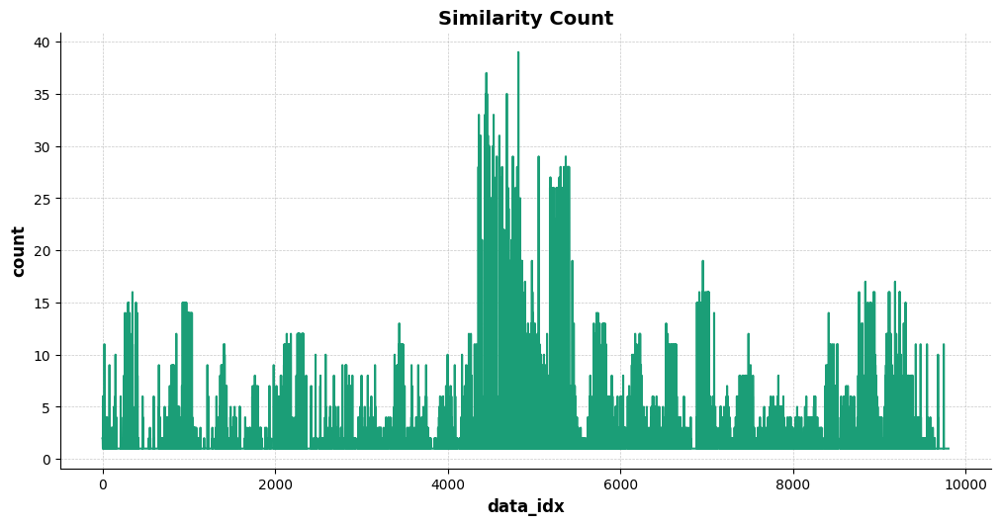

In [ ]:
from matplotlib import pyplot as plt
import seaborn as sns
def _plot_series(series, series_name, series_index=0):
  palette = list(sns.palettes.mpl_palette('Dark2'))
  xs = series['idx']
  ys = series['count']

  plt.plot(xs, ys, label=series_name, color=palette[series_index % len(palette)])

fig, ax = plt.subplots(figsize=(10, 5.2), layout='constrained')
df_sorted = sim_idx.sort_values('idx', ascending=True)
_plot_series(df_sorted, '')
sns.despine(fig=fig, ax=ax)
plt.xlabel('data_idx', fontsize=12, fontweight='bold')
_ = plt.ylabel('count', fontsize=12, fontweight='bold')
plt.title('Similarity Count', fontsize=14, fontweight='bold')
plt.grid(True, which='both', linestyle='--', linewidth=0.5, alpha=0.7)
plt.xticks(fontsize=10)
plt.yticks(fontsize=10)
plt.show()

In [ ]:
# Find the row with the maximum 'count' value
max_similar_image = sim_idx.loc[sim_idx['count'].idxmax()]

# Extract the information
index_of_max_similar = max_similar_image['idx']
image_with_max_similar = max_similar_image['im_file']
similar_images_count = max_similar_image['count']
similar_images_list = max_similar_image['sim_im_files']

print(f"Index of the image with the highest number of similar images: {index_of_max_similar}")
print(f"Image with the highest number of similar images: {image_with_max_similar}")
print(f"Number of similar images: {similar_images_count}")
print(f"List of similar images: {similar_images_list}")

Index of the image with the highest number of similar images: 4818
Image with the highest number of similar images: /content/drive/My Drive/Colab Notebooks/Final_Dataset/images/frame3280 (5).jpg
Number of similar images: 39
List of similar images: ['/content/drive/My Drive/Colab Notebooks/Final_Dataset/images/frame3280 (5).jpg' '/content/drive/My Drive/Colab Notebooks/Final_Dataset/images/frame3260 (5).jpg' '/content/drive/My Drive/Colab Notebooks/Final_Dataset/images/frame3250 (5).jpg'
 '/content/drive/My Drive/Colab Notebooks/Final_Dataset/images/frame3240 (5).jpg' '/content/drive/My Drive/Colab Notebooks/Final_Dataset/images/frame3300 (5).jpg' '/content/drive/My Drive/Colab Notebooks/Final_Dataset/images/frame3230 (5).jpg'
 '/content/drive/My Drive/Colab Notebooks/Final_Dataset/images/frame3220 (5).jpg' '/content/drive/My Drive/Colab Notebooks/Final_Dataset/images/frame3200 (5).jpg' '/content/drive/My Drive/Colab Notebooks/Final_Dataset/images/frame3320 (5).jpg'
 '/content/drive/My 

In [ ]:
# Calculate the average count of similarity
average_similarity_count = sim_idx['count'].mean()

print(f"Average count of similarity across all images: {average_similarity_count:.2f}")

"""
Means that on average, each image has 1 extra image, similar to her.
"""

Average count of similarity across all images: 1.93


'\nMeans that on average, each image has 1 extra image, similar to her.\n'

In [ ]:
# Find the images that contain ONLY regular vehicles (none emergency)

non_emergency_images = exp.sql_query("WHERE labels NOT LIKE '%police force%' AND labels NOT LIKE '%emergency medical services%' AND labels NOT LIKE '%fire department%' AND labels NOT LIKE '%rescue vehicle%' AND labels NOT LIKE '%military vehicle%'")
non_emergency_images

Running query: SELECT * FROM 'table' WHERE labels NOT LIKE '%police force%' AND labels NOT LIKE '%emergency medical services%' AND labels NOT LIKE '%fire department%' AND labels NOT LIKE '%rescue vehicle%' AND labels NOT LIKE '%military vehicle%'


,im_file,labels,cls,bboxes,masks,keypoints,vector
0,/content/drive/My Drive/Colab Notebooks/Final_...,"[car, truck, truck]","[2, 7, 7]","[[249.4998321533203, 221.5000762939453, 289.99...",[[[]]],[[[]]],"[0.132638081908226, 0.1064637079834938, 0.1126..."
1,/content/drive/My Drive/Colab Notebooks/Final_...,"[car, car, car, car, car, car, truck, truck]","[2, 2, 2, 2, 2, 2, 7, 7]","[[440.0, 214.00003051757812, 521.5001831054688...",[[[]]],[[[]]],"[0.197268545627594, 0.056489117443561554, 0.10..."
2,/content/drive/My Drive/Colab Notebooks/Final_...,"[car, car, car, car, car, car, car, car, truck...","[2, 2, 2, 2, 2, 2, 2, 2, 7, 7]","[[441.0003356933594, 213.99984741210938, 522.0...",[[[]]],[[[]]],"[0.18284012377262115, 0.04661327973008156, 0.0..."
3,/content/drive/My Drive/Colab Notebooks/Final_...,"[car, car, car, car, car, car, car, car, truck...","[2, 2, 2, 2, 2, 2, 2, 2, 7, 7]","[[356.9999694824219, 215.50013732910156, 436.5...",[[[]]],[[[]]],"[0.14373129606246948, 0.04747091978788376, 0.0..."
4,/content/drive/My Drive/Colab Notebooks/Final_...,"[car, car, car, car, car, car, car, car, car, ...","[2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 7, ...","[[250.49954223632812, 191.5001983642578, 343.4...",[[[]]],[[[]]],"[0.26433706283569336, 0.08439845591783524, 0.1..."
...,...,...,...,...,...,...,...
3257,/content/drive/My Drive/Colab Notebooks/Final_...,"[car, car, car, car, car, car, car, car, car, ...","[2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 7]","[[303.4998474121094, 204.50015258789062, 311.9...",[[[]]],[[[]]],"[0.20524422824382782, 0.059955935925245285, 0...."
3258,/content/drive/My Drive/Colab Notebooks/Final_...,"[car, car, car, car, car, car, car, car, car, ...","[2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 7, 7, 7, 7, ...","[[5.000314712524414, 216.99989318847656, 182.0...",[[[]]],[[[]]],"[0.24371282756328583, 0.02942487597465515, 0.0..."
3259,/content/drive/My Drive/Colab Notebooks/Final_...,"[car, truck, truck]","[2, 7, 7]","[[45.0, 178.00021362304688, 51.99968338012695,...",[[[]]],[[[]]],"[0.03006458654999733, 0.1653694063425064, 0.06..."
3260,/content/drive/My Drive/Colab Notebooks/Final_...,"[car, car]","[2, 2]","[[8.000321388244629, 175.5, 79.0, 257.50006103...",[[[]]],[[[]]],"[0.25987938046455383, 0.06498681753873825, 0.0..."


In [ ]:
# Find the images that contain ONLY emergency vehicles (none regular)

emergency_images = exp.sql_query("WHERE labels NOT LIKE '%car%' AND labels NOT LIKE '%motorcycle%' AND labels NOT LIKE '%truck%' AND labels NOT LIKE '%bus%'")
emergency_images

Running query: SELECT * FROM 'table' WHERE labels NOT LIKE '%car%' AND labels NOT LIKE '%motorcycle%' AND labels NOT LIKE '%truck%' AND labels NOT LIKE '%bus%'


,im_file,labels,cls,bboxes,masks,keypoints,vector
0,/content/drive/My Drive/Colab Notebooks/Final_...,[police force],[0],"[[380.00030517578125, 198.49986267089844, 419....",[[[]]],[[[]]],"[0.26405566930770874, 0.06220744922757149, 0.0..."
1,/content/drive/My Drive/Colab Notebooks/Final_...,[police force],[0],"[[410.99969482421875, 185.50009155273438, 512....",[[[]]],[[[]]],"[0.2526577115058899, 0.07648508250713348, 0.10..."
2,/content/drive/My Drive/Colab Notebooks/Final_...,[fire department],[4],"[[353.49981689453125, 140.999755859375, 371.49...",[[[]]],[[[]]],"[0.15676532685756683, 0.13200050592422485, -0...."
3,/content/drive/My Drive/Colab Notebooks/Final_...,[fire department],[4],"[[351.49981689453125, 138.50010681152344, 365....",[[[]]],[[[]]],"[0.1622297167778015, 0.08868176490068436, -0.0..."
4,/content/drive/My Drive/Colab Notebooks/Final_...,[fire department],[4],"[[351.4998779296875, 140.5000762939453, 371.0,...",[[[]]],[[[]]],"[0.12781092524528503, 0.05596114695072174, -0...."
...,...,...,...,...,...,...,...
370,/content/drive/My Drive/Colab Notebooks/Final_...,[police force],[0],"[[258.0, 156.99978637695312, 284.4998474121094...",[[[]]],[[[]]],"[0.39104679226875305, 0.011057849042117596, 0...."
371,/content/drive/My Drive/Colab Notebooks/Final_...,[police force],[0],"[[248.00001525878906, 156.50009155273438, 276....",[[[]]],[[[]]],"[0.296478271484375, -0.0036228043027222157, 0...."
372,/content/drive/My Drive/Colab Notebooks/Final_...,[police force],[0],"[[216.00030517578125, 154.5001220703125, 270.0...",[[[]]],[[[]]],"[0.3935631513595581, -0.01969519443809986, 0.0..."
373,/content/drive/My Drive/Colab Notebooks/Final_...,[police force],[0],"[[182.50015258789062, 154.49993896484375, 255....",[[[]]],[[[]]],"[0.3298201858997345, 0.009784594178199768, 0.0..."


In [ ]:
# Total number of images in the dataset
total_images = 9796

# Number of images with no emergency vehicles
num_only_regular_images = 3280

# Number of images with only emergency vehicles
num_only_emergency_images = 381

# Number of images with both emergency vehicles and regular
num_both_vehicles_images = total_images - (num_only_regular_images + num_only_emergency_images)

# Calculate the percentages
percentage_only_regular = (num_only_regular_images / total_images) * 100
percentage_only_emergency = (num_only_emergency_images / total_images) * 100
percentage_both_vehicles = (num_both_vehicles_images / total_images) * 100

# Display the results
print(f"Percentage of Images with Only regular Vehicles: {percentage_only_regular:.2f}%")
print(f"Percentage of Images with Only Emergency Vehicles: {percentage_only_emergency:.2f}%")
print(f"Percentage of Images with Both Emergency & Regular Vehicles: {percentage_both_vehicles:.2f}%")

Percentage of Images with Only regular Vehicles: 33.48%
Percentage of Images with Only Emergency Vehicles: 3.89%
Percentage of Images with Both Emergency & Regular Vehicles: 62.63%


In [ ]:
# Define the list of classes
regular_classes = [
    'car',
    'motorcycle',
    'truck',
    'bus'
]

# Initialize a dictionary to store counts
class_counts = {}

# Loop through each class and count occurrences
for class_name in regular_classes:
    count = exp.sql_query(f"SELECT COUNT(*) as count FROM 'table' WHERE labels LIKE '%{class_name}%'").iloc[0]['count']
    class_counts[class_name] = count

# Display the counts
for class_name, count in class_counts.items():
    print(f"Number of {class_name}: {count}")

Running query: SELECT COUNT(*) as count FROM 'table' WHERE labels LIKE '%car%'
Running query: SELECT COUNT(*) as count FROM 'table' WHERE labels LIKE '%motorcycle%'
Running query: SELECT COUNT(*) as count FROM 'table' WHERE labels LIKE '%truck%'
Running query: SELECT COUNT(*) as count FROM 'table' WHERE labels LIKE '%bus%'
Number of car: 8997
Number of motorcycle: 252
Number of truck: 5508
Number of bus: 377


In [ ]:
# Define the list of classes
emergency_classes = [
    'police force',
    'emergency medical services',
    'fire department',
    'rescue vehicle',
    'military vehicle'
]

# Initialize a dictionary to store counts
class_counts = {}

# Loop through each class and count occurrences
for class_name in emergency_classes:
    count = exp.sql_query(f"SELECT COUNT(*) as count FROM 'table' WHERE labels LIKE '%{class_name}%'").iloc[0]['count']
    class_counts[class_name] = count

# Display the counts
for class_name, count in class_counts.items():
    print(f"Number of {class_name}: {count}")

Running query: SELECT COUNT(*) as count FROM 'table' WHERE labels LIKE '%police force%'
Running query: SELECT COUNT(*) as count FROM 'table' WHERE labels LIKE '%emergency medical services%'
Running query: SELECT COUNT(*) as count FROM 'table' WHERE labels LIKE '%fire department%'
Running query: SELECT COUNT(*) as count FROM 'table' WHERE labels LIKE '%rescue vehicle%'
Running query: SELECT COUNT(*) as count FROM 'table' WHERE labels LIKE '%military vehicle%'
Number of police force: 2416
Number of emergency medical services: 3470
Number of fire department: 583
Number of rescue vehicle: 135
Number of military vehicle: 20


In [ ]:
# Define counts for each regular vehicle
num_car = 8976
num_motorcycle = 231
num_truck = 5550
num_bus = 378

# Define counts for each emergency vehicle
num_police_force = 2397
num_emergency_medical_services = 3423
num_fire_department = 616
num_rescue_vehicle = 143
num_military_vehicle = 24

# Calculate total number of regular and emergency vehicles
total_regular_vehicles = num_car + num_motorcycle + num_truck + num_bus
total_emergency_vehicles = num_police_force + num_emergency_medical_services + num_fire_department + num_rescue_vehicle + num_military_vehicle

# Calculate total number of vehicles (regular + emergency)
total_vehicles = total_regular_vehicles + total_emergency_vehicles

# Calculate percentages
percentage_regular_vehicles = (total_regular_vehicles / total_vehicles) * 100
percentage_emergency_vehicles = (total_emergency_vehicles / total_vehicles) * 100

# Print the results
print(f"Percentage of Regular Vehicles: {percentage_regular_vehicles:.2f}%")
print(f"Percentage of Emergency Vehicles: {percentage_emergency_vehicles:.2f}%")

Percentage of Regular Vehicles: 69.62%
Percentage of Emergency Vehicles: 30.38%


In [ ]:
# class counts
class_counts = {
    'car': 8976,
    'truck': 5550,
    'emergency medical services': 3423,
    'police force': 2397,
    'fire department': 616,
    'bus': 378,
    'motorcycle': 231,
    'rescue vehicle': 143,
    'military vehicle': 24
}

# Extract class labels and their corresponding counts
labels = list(class_counts.keys())
counts = list(class_counts.values())

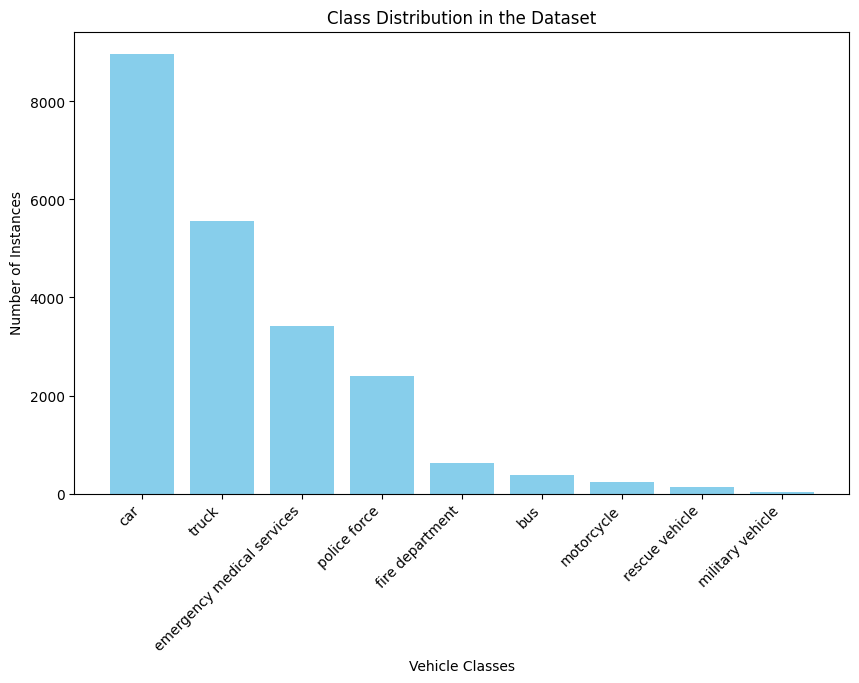

In [ ]:
import matplotlib.pyplot as plt

# Plot the bar chart
plt.figure(figsize=(10, 6))
plt.bar(labels, counts, color='skyblue')

# Add labels and title
plt.xlabel('Vehicle Classes')
plt.ylabel('Number of Instances')
plt.title('Class Distribution in the Dataset')

# Rotate the x-axis labels for better readability if needed
plt.xticks(rotation=45, ha="right")

# Show the plot
plt.show()

In [ ]:
table = exp.table
table.schema

im_file: string not null
labels: list<item: string> not null
  child 0, item: string
cls: list<item: int64> not null
  child 0, item: int64
bboxes: list<item: list<item: double>> not null
  child 0, item: list<item: double>
      child 0, item: double
masks: list<item: list<item: list<item: int64>>> not null
  child 0, item: list<item: list<item: int64>>
      child 0, item: list<item: int64>
          child 0, item: int64
keypoints: list<item: list<item: list<item: double>>> not null
  child 0, item: list<item: list<item: double>>
      child 0, item: list<item: double>
          child 0, item: double
vector: fixed_size_list<item: float>[512] not null
  child 0, item: float

In [ ]:
embeddings = table.to_pandas()["vector"]
print(embeddings)

0       [0.13263808, 0.10646371, 0.11268048, -0.128706...
1       [0.19726855, 0.056489117, 0.10215303, -0.17685...
2       [0.18284012, 0.04661328, 0.07873533, -0.182127...
3       [0.1437313, 0.04747092, 0.061474282, -0.156203...
4       [0.26433706, 0.084398456, 0.124146186, -0.1314...
                              ...                        
9797    [0.16999766, 0.07312103, 0.110860065, -0.13344...
9798    [0.12749322, 0.09261963, 0.07839301, -0.138865...
9799    [0.11126434, 0.115743205, 0.06908167, -0.14146...
9800    [0.19638398, 0.004062612, 0.1405593, 0.0228818...
9801    [0.2715974, 0.026460785, 0.04595586, -0.046442...
Name: vector, Length: 9802, dtype: object


In [ ]:
import numpy as np

embeddings = table.to_pandas()["vector"].tolist()
embeddings = np.array(embeddings)

/usr/local/lib/python3.10/dist-packages/sklearn/cluster/_kmeans.py:1416: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  super()._check_params_vs_input(X, default_n_init=10)


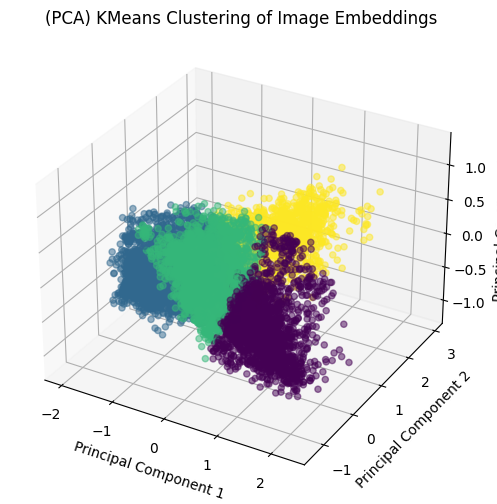

In [ ]:
# Scatter plot to vizualize how my data are distributed in the reduced feature space

from sklearn.cluster import KMeans
%matplotlib inline
import numpy as np
from sklearn.decomposition import PCA
import matplotlib.pyplot as plt
from mpl_toolkits.mplot3d import Axes3D

# Apply KMeans clustering to group vectors with similar features
kmeans = KMeans(n_clusters=4, random_state=0).fit(embeddings)

# Reduce dimensions using PCA to 3 components--> linear combinations of the original features
pca = PCA(n_components=3) # Reduced 512-Dimensional Data (PCA) to 3 Dimensions
reduced_data = pca.fit_transform(embeddings)

# Create a 3D scatter plot using Matplotlib's Axes3D
fig = plt.figure(figsize=(8, 6))
ax = fig.add_subplot(111, projection='3d')

# Plot the clusters
ax.scatter(reduced_data[:, 0], reduced_data[:, 1], reduced_data[:, 2], c=kmeans.labels_, cmap='viridis', alpha=0.5)
ax.set_title("(PCA) KMeans Clustering of Image Embeddings")
ax.set_xlabel('Principal Component 1') # captures the most variance
ax.set_ylabel('Principal Component 2') # captures the second most variance
ax.set_zlabel('Principal Component 3') # captures the third most

plt.show()

In [ ]:
# Create a vector index for faster similarity searching (from kNN to ANN)

table.create_index(
    num_partitions=128,  # Number of partitions
    num_sub_vectors=512   # Number of sub-vectors for Product Quantization
)

In [ ]:
# Retrieve the full vector from the table using the index

embedding = table.to_pandas().iloc[370]["vector"]

result = table.search(embedding).metric("L2").select(["im_file", "labels"]).to_pandas()
result

,im_file,labels,_distance
0,/content/drive/My Drive/Colab Notebooks/Final_...,"[car, car, truck, truck, truck, truck]",0.000064
1,/content/drive/My Drive/Colab Notebooks/Final_...,"[car, car, car, truck, truck, truck, truck]",0.353796
2,/content/drive/My Drive/Colab Notebooks/Final_...,"[car, car, truck, truck, truck, truck]",0.391043
3,/content/drive/My Drive/Colab Notebooks/Final_...,"[car, truck, truck]",0.515692
4,/content/drive/My Drive/Colab Notebooks/Final_...,"[police force, car, truck, truck, truck, truck]",0.521430
5,/content/drive/My Drive/Colab Notebooks/Final_...,"[car, car, car, truck, truck, truck]",0.541426
6,/content/drive/My Drive/Colab Notebooks/Final_...,"[police force, car, truck, truck, truck, truck]",0.543759
7,/content/drive/My Drive/Colab Notebooks/Final_...,"[police force, car, car, truck, truck, truck]",0.549770
8,/content/drive/My Drive/Colab Notebooks/Final_...,"[car, car, car, car, truck, truck, truck]",0.580466
9,/content/drive/My Drive/Colab Notebooks/Final_...,"[car, car, car, fire department, truck, truck]",0.580734


In [ ]:
# Search for images that contain 'emergency medical services' and 'police force' labels across the entire table

result = table.search().where("ARRAY_CONTAINS(labels, 'police force') AND ARRAY_CONTAINS(labels, 'emergency medical services')", prefilter=False).to_pandas()
result

,im_file,labels,cls,bboxes,masks,keypoints,vector
0,/content/drive/My Drive/Colab Notebooks/Final_...,"[police force, emergency medical services, tru...","[0, 1, 7, 8]","[[285.99969482421875, 214.4998779296875, 295.0...",[[[]]],[[[]]],"[0.1607912, 0.10309957, 0.12722303, -0.0822732..."
1,/content/drive/My Drive/Colab Notebooks/Final_...,"[police force, emergency medical services, tru...","[0, 1, 7, 8]","[[286.5001525878906, 217.00009155273438, 298.0...",[[[]]],[[[]]],"[0.14005944, 0.080714844, 0.12480655, -0.09754..."
2,/content/drive/My Drive/Colab Notebooks/Final_...,"[police force, emergency medical services, tru...","[0, 1, 7, 8]","[[288.50018310546875, 213.4998016357422, 304.0...",[[[]]],[[[]]],"[0.15686347, 0.09365833, 0.14149418, -0.093016..."
3,/content/drive/My Drive/Colab Notebooks/Final_...,"[police force, emergency medical services, car...","[0, 1, 2, 2, 2, 2, 2, 2, 5, 7, 7, 7]","[[456.00030517578125, 122.999755859375, 476.50...",[[[]]],[[[]]],"[0.18742777, 0.010848595, 0.07007041, -0.03333..."
4,/content/drive/My Drive/Colab Notebooks/Final_...,"[police force, police force, emergency medical...","[0, 0, 1, 2, 2, 2, 2, 2, 7, 7, 7, 7]","[[451.4998779296875, 122.4999008178711, 473.49...",[[[]]],[[[]]],"[0.11636949, -0.023663174, -0.0183111, -0.0217..."
5,/content/drive/My Drive/Colab Notebooks/Final_...,"[police force, police force, emergency medical...","[0, 0, 1, 2, 2, 2, 2, 2, 2, 2, 2, 7, 7, 7, 7, ...","[[445.00030517578125, 125.0000991821289, 469.0...",[[[]]],[[[]]],"[0.21484955, 0.046394072, 0.06625834, -0.13463..."
6,/content/drive/My Drive/Colab Notebooks/Final_...,"[police force, emergency medical services, car...","[0, 1, 2, 2, 2, 2, 2, 2, 2, 2, 2, 7, 7, 7, 7]","[[256.5001525878906, 170.50013732910156, 269.5...",[[[]]],[[[]]],"[0.154509, 0.15144627, 0.18760476, -0.12569162..."
7,/content/drive/My Drive/Colab Notebooks/Final_...,"[police force, emergency medical services, car...","[0, 1, 2, 2, 2, 2, 2, 2, 2, 7, 7, 7, 7]","[[254.00001525878906, 169.4998779296875, 269.0...",[[[]]],[[[]]],"[0.18739465, 0.19095966, 0.22639023, -0.109200..."
8,/content/drive/My Drive/Colab Notebooks/Final_...,"[police force, emergency medical services, car...","[0, 1, 2, 2, 2, 2, 2, 2, 7, 7]","[[253.0, 169.4998779296875, 267.0, 182.9998626...",[[[]]],[[[]]],"[0.14646448, 0.22039036, 0.21981975, -0.095909..."
9,/content/drive/My Drive/Colab Notebooks/Final_...,"[police force, emergency medical services, car...","[0, 1, 2, 2, 2, 2, 2, 2, 2, 2, 2, 7, 7, 7, 7]","[[226.00033569335938, 162.99990844726562, 254....",[[[]]],[[[]]],"[0.18500924, 0.1738046, 0.20307486, -0.1034989..."


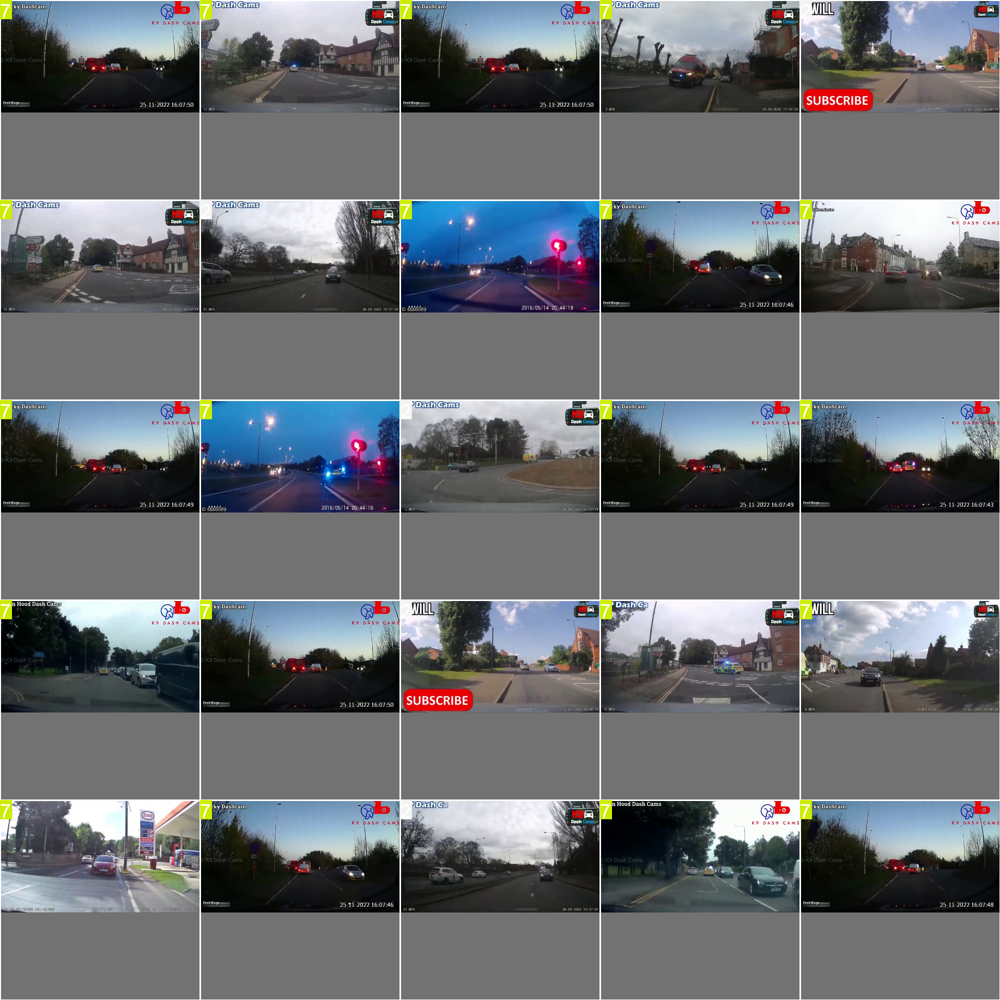

In [ ]:
exp.plot_similar(
    img=["/content/drive/My Drive/Colab Notebooks/Final_Dataset/images/frame6730 (10).jpg", "/content/drive/My Drive/Colab Notebooks/Final_Dataset/images/frame13100 (5).jpg", "/content/drive/My Drive/Colab Notebooks/Final_Dataset/images/frame7510 (7).jpg"],
    labels=False
)

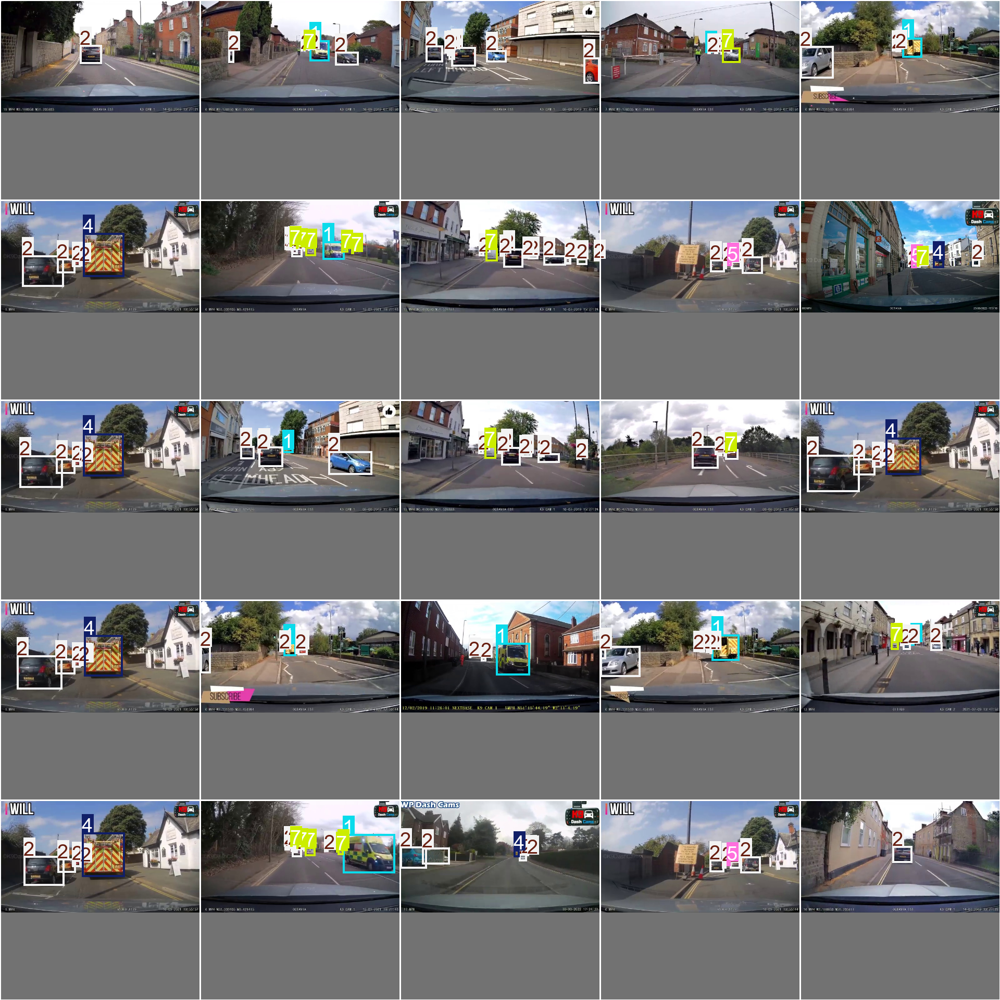

In [ ]:
exp.plot_similar(idx=[480, 4560]) # Using avg embeddings of 2 images

In [ ]:
# Search for similar vectors with a filter

result = table.search(np.random.random((512))) \
    .where("ARRAY_CONTAINS(labels, 'fire department')", prefilter=True) \
    .limit(10) \
    .to_pandas()

result

,im_file,labels,cls,bboxes,masks,keypoints,vector,_distance
0,/content/drive/My Drive/Colab Notebooks/Final_...,"[car, fire department]","[2, 4]","[[36.499839782714844, 213.99984741210938, 86.9...",[[[]]],[[[]]],"[0.04736514, 0.14351429, 0.1757254, -0.143933,...",142.482788
1,/content/drive/My Drive/Colab Notebooks/Final_...,[fire department],[4],"[[0.5001592636108398, 9.499858856201172, 89.0,...",[[[]]],[[[]]],"[0.029952358, 0.19145219, 0.15056439, -0.14595...",142.624313
2,/content/drive/My Drive/Colab Notebooks/Final_...,"[car, car, car, fire department, fire departme...","[2, 2, 2, 4, 4, 4, 6]","[[0.5001598596572876, 230.0000457763672, 13.0,...",[[[]]],[[[]]],"[0.093109556, 0.08344535, 0.16164833, -0.13271...",143.038635
3,/content/drive/My Drive/Colab Notebooks/Final_...,"[car, car, fire department, fire department, f...","[2, 2, 4, 4, 4, 6]","[[208.00001525878906, 225.5000457763672, 223.0...",[[[]]],[[[]]],"[0.09908535, 0.08750363, 0.17235655, -0.112914...",143.164871
4,/content/drive/My Drive/Colab Notebooks/Final_...,"[car, fire department]","[2, 4]","[[34.0, 219.50009155273438, 93.00032043457031,...",[[[]]],[[[]]],"[0.10180872, 0.15708491, 0.15219972, -0.152586...",143.309311
5,/content/drive/My Drive/Colab Notebooks/Final_...,"[car, fire department]","[2, 4]","[[22.999996185302734, 219.0000762939453, 81.0,...",[[[]]],[[[]]],"[0.097098455, 0.15015537, 0.14992508, -0.15184...",144.397446
6,/content/drive/My Drive/Colab Notebooks/Final_...,[fire department],[4],"[[0.5001592636108398, 9.999897003173828, 109.0...",[[[]]],[[[]]],"[0.045732852, 0.21191175, 0.19241934, -0.13578...",144.489929
7,/content/drive/My Drive/Colab Notebooks/Final_...,"[car, car, car, fire department]","[2, 2, 2, 4]","[[265.99969482421875, 224.4999542236328, 285.4...",[[[]]],[[[]]],"[0.115398444, 0.08182854, 0.1613843, -0.129062...",145.047668
8,/content/drive/My Drive/Colab Notebooks/Final_...,"[car, car, car, fire department]","[2, 2, 2, 4]","[[268.5001525878906, 222.49981689453125, 286.5...",[[[]]],[[[]]],"[0.12667924, 0.091741994, 0.14146593, -0.14195...",145.050888
9,/content/drive/My Drive/Colab Notebooks/Final_...,"[car, car, car, car, car, car, fire department]","[2, 2, 2, 2, 2, 2, 4]","[[251.9996795654297, 236.99986267089844, 283.4...",[[[]]],[[[]]],"[0.1327206, 0.12739323, 0.14808956, -0.1332509...",145.224365


Running query: SELECT * FROM 'table' WHERE ARRAY_CONTAINS(labels, 'military vehicle')


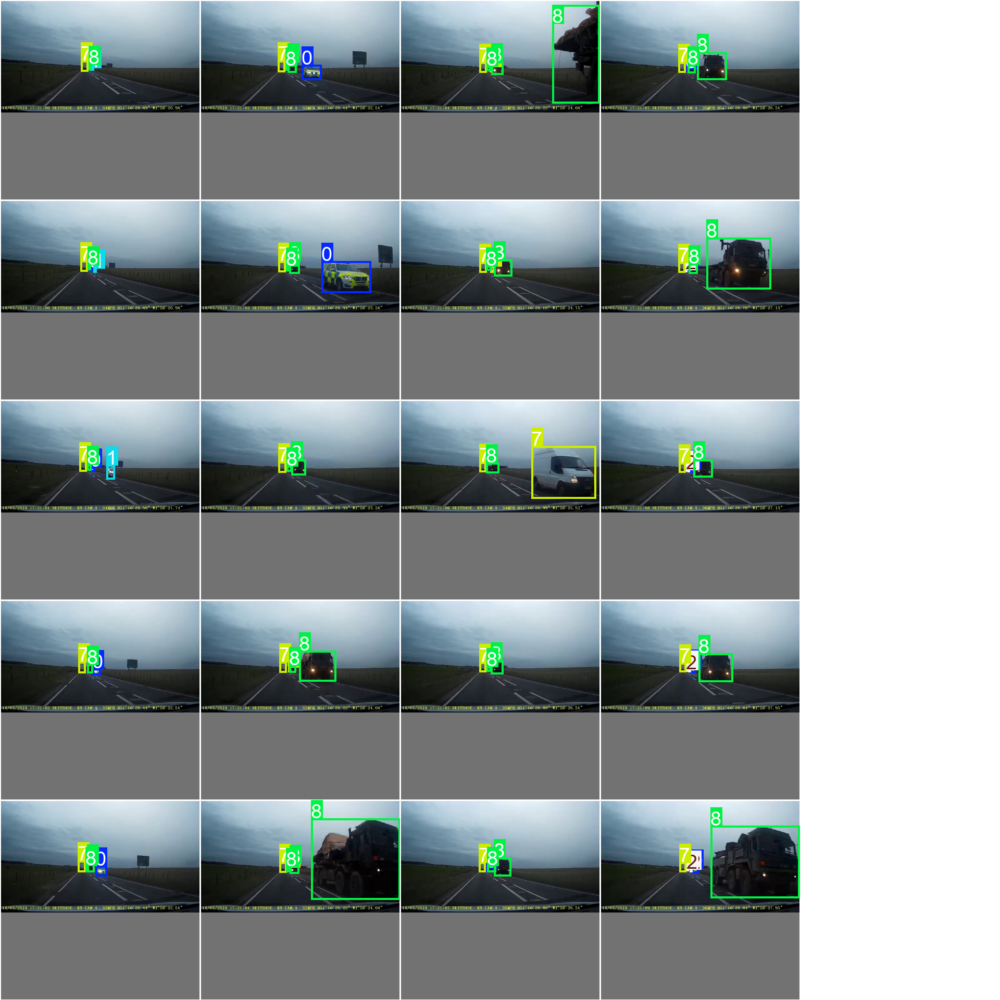

In [ ]:
exp.plot_sql_query("WHERE ARRAY_CONTAINS(labels, 'military vehicle')", labels=True)